# Librerías y dependencias

In [ ]:
# Montar drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install pyLDAvis
!python -m spacy download es_core_news_sm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 23.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.9/12.9 MB 54.5 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('es_core_news_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [ ]:
!pip install unidecode

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.5/235.5 kB 5.2 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import spacy
import nltk
from nltk import corpus
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from collections import Counter
from unidecode import unidecode

# Preprocesamiento del texto

In [ ]:
# Cargar datos
def load_data(path):
  with open(path, 'r') as f:
    data = pd.read_csv(f)
  return data

In [ ]:
df_train = load_data("/content/drive/Shareddrives/PLN/Practica02/Data/df_train.csv")
df_test = load_data("/content/drive/Shareddrives/PLN/Practica02/Data/df_test.csv")
df_validation = load_data("/content/drive/Shareddrives/PLN/Practica02/Data/df_val.csv")

In [ ]:
df_train.head()

,news_title,news_text_content,category,label
0,en una ceremonia secreta se casó la presentado...,el matrimonio se celebró en la ciudad de barra...,gente,0
1,del relevo de amancio ortega al éxito de las m...,el principio del fin de amaya arzuaga. el muti...,innovación,1
2,codirectora soto colombia debe continuar refor...,en el marco del evento perspectivas colombia 2...,macroeconomia,2
3,los factores por los que aumenta el nivel de á...,cuando los niveles de ácido úrico son elevados...,gente,0
4,trampeando con la alianza de civilizaciones,"me dirán que, ante el malismo de otros, bienve...",alianzas,3


Se crea una nueva columna 'text' a la cual se le aplicará todo el preprocesamiento:

In [ ]:
df_train['text'] = df_train['category'] + ' ' + df_train['news_title'] + ' ' + df_train['news_text_content']
df_test['text'] = df_test['news_title'] + ' ' + df_test['news_text_content']
df_validation['text'] = df_validation['news_title'] + ' ' + df_validation['news_text_content']

In [ ]:
df_train.head()

,news_title,news_text_content,category,label,text
0,en una ceremonia secreta se casó la presentado...,el matrimonio se celebró en la ciudad de barra...,gente,0,gente en una ceremonia secreta se casó la pres...
1,del relevo de amancio ortega al éxito de las m...,el principio del fin de amaya arzuaga. el muti...,innovación,1,innovación del relevo de amancio ortega al éxi...
2,codirectora soto colombia debe continuar refor...,en el marco del evento perspectivas colombia 2...,macroeconomia,2,macroeconomia codirectora soto colombia debe c...
3,los factores por los que aumenta el nivel de á...,cuando los niveles de ácido úrico son elevados...,gente,0,gente los factores por los que aumenta el nive...
4,trampeando con la alianza de civilizaciones,"me dirán que, ante el malismo de otros, bienve...",alianzas,3,alianzas trampeando con la alianza de civiliza...


In [ ]:
df_train['category'].value_counts()

,count
category,
macroeconomia,9927
reputacion,8501
alianzas,8416
innovación,8330
gente,7906
regulaciones,7341
sostenibilidad,6257
otros,3880


In [ ]:
df_train.shape

(60558, 5)

Decisiones tomadas para el preprocesamiento:

* Se utiliza el método nlp.pipe() de Spacy para procesar los textos por lotes y hacer el proceso más eficiente
* Se filtran tokens que no sean stopwords, signos de puntuación o números, y que aparezcan menos de 5 veces en todo el texto
* Se decide utilizar lematización en lugar de stemming debido a que esta toma en cuenta el contexto lo cual es relevante para poder identificar correctamente los temas

In [ ]:
# Cargar modelo de spaCy y stopwords de NLTK
nlp = spacy.load("es_core_news_sm", disable=["ner", "parser"])
nltk.download("stopwords")
stop_words = set(stopwords.words("spanish"))

def preprocess_texts(texts):
    tokenized_texts = []

    for doc in nlp.pipe(texts, batch_size=500):
        tokens = [
            unidecode(token.lemma_.lower())
            for token in doc
            if not token.is_punct and not token.is_digit and unidecode(token.text.lower()) not in stop_words
        ]
        tokenized_texts.append(tokens)

    word_counts = Counter(word for tokens in tokenized_texts for word in tokens)

    # Filtrar palabras con frecuencia menor a 10
    filtered_texts = []
    for text_tokens in tokenized_texts:
        filtered_text = " ".join([word for word in text_tokens if word_counts[word] >= 10])
        filtered_texts.append(filtered_text)

    return filtered_texts

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
df_train['text'] = preprocess_texts(df_train['text'].to_list())

In [ ]:
# Guardar los datos preprocesados para no correr la función nuevamente
df_train['text'].to_csv('/content/drive/Shareddrives/PLN/Practica02/Modulo_Temas/tokens.csv', index=False)

# Modelado de temas

In [ ]:
!pip install gensim

Para la creación del diccionario y el corpus con los que se entrenará al modelo, se usan los métodos corpora.Dictionary() y dicitionary.doc2bow():
* dictionary mapea las palabras a identificadores numéricos
* corpus crea la respectiva bolsa de palabras (BoW) para cada documento

In [ ]:
# Creación de diccionario y corpus
from gensim import corpora
from gensim.models import LdaModel

tokens = pd.read_csv('/content/drive/Shareddrives/PLN/Practica02/Modulo_Temas/tokens.csv')
dictionary = corpora.Dictionary(tokens['text'].str.split())
corpus = [dictionary.doc2bow(text.split()) for text in tokens['text']]

In [ ]:
# Guardar el diccionario
dictionary.save("/content/drive/Shareddrives/PLN/Practica02/Modulo_Temas/dictionary.gensim")

La determinación del número de temas que se identificarán para cada artículo se realiza evaluando la coherencia del modelo basada en la similitud del coseno para distintos valores entre 9 y 16. Esto se realiza con el método CoherenceModel(). Así, el valor de coherencia más alto será el elegido para el modelo final.

Nota: se realizaron primero pruebas para valores entre 2 y 8 temas, pero los valores rondaban menores al 40% de coherencia.

In [ ]:
# Determinar número de temas a mostrar para cada artículo usando la coherencia
from gensim.models import CoherenceModel

def check_coherence(corpus, dictionary, texts, k_vals):
    c = []
    for k in k_vals:
        lda = LdaModel(corpus=corpus, id2word=dictionary, num_topics=k, alpha='auto', eta='auto', passes=10, random_state=16)
        cm = CoherenceModel(model=lda, texts=texts, dictionary=dictionary, coherence="c_v")
        score = cm.get_coherence()
        c.append((k, score))
        print(f"K: {k}, Coherence: {score}")
    return c

In [ ]:
texts = tokens['text'].apply(lambda x: x.split()).tolist()
texts

[['gente',
  'ceremonia',
  'secreto',
  'casar',
  'presentadora',
  'elianis',
  'garrido',
  'matrimonio',
  'celebrar',
  'ciudad',
  'barranquilla',
  'ciudad',
  'natal',
  'presentadora',
  'imagen',
  'demostrar',
  'boda',
  'último',
  'mes',
  'especular',
  'plan',
  'matrimonio',
  'presentadora',
  'saber',
  'elianis',
  'garrido',
  'aunque',
  'fecha',
  'embargo',
  'exprotagonista',
  'novela',
  'dar',
  'gran',
  'sorpresa',
  'seguidor',
  'revelar',
  'día',
  'ayer',
  'casar',
  'ceremonia',
  'íntimo',
  'momento',
  'conocer',
  'varios',
  'imagen',
  'primero',
  'revelar',
  'él',
  'mismo',
  'elianis',
  'medio',
  'red',
  'social',
  'compartir',
  'fotografía',
  'evento',
  'lado',
  'mar',
  'dicho',
  'abreboca',
  'muestra',
  'parecer',
  'celebración',
  'vida',
  'alcance',
  'cumplir',
  'sueños',
  'junto',
  'esposo',
  'gracias',
  'cambiar',
  'yo',
  'forma',
  'ver',
  'mundo',
  'postear',
  'presentadora',
  'cuenta',
  'oficial',
  'i

In [ ]:
coherence = check_coherence(corpus, dictionary, texts, range(9, 16))

K: 9, Coherence: 0.4158096155646793
K: 10, Coherence: 0.4141656237217597
K: 11, Coherence: 0.4462414385472615
K: 12, Coherence: 0.4575080921234244
K: 13, Coherence: 0.46395547386678077
K: 14, Coherence: 0.4619757516788523
K: 15, Coherence: 0.46441198531102906


In [ ]:
best_coherence = coherence[0]
for k, score in coherence:
    if score > best_coherence[1]:
        best_coherence = (k, score)

print(f"El mejor valor de K es {best_coherence[0]} con una coherencia de {best_coherence[1]}")

El mejor valor de K es 15 con una coherencia de 0.46441198531102906


Se entrena el modelo con 15 temas por cada noticia y se establecen los siguientes parámetros:
* alpha='auto': Controla la distribución de temas por documento.
* eta='auto': Controla la distribución de palabras por tema.
* passes=10: Número de veces que el modelo pasa sobre los datos en cada iteración.


In [ ]:
# Entrenamiento del modelo con 11 tópicos por artículo
lda = LdaModel(corpus=corpus, id2word=dictionary, num_topics=best_coherence[0], alpha='auto', eta='auto', passes=10, random_state=16)

In [ ]:
lda.save("/content/drive/Shareddrives/PLN/Practica02/Modulo_Temas/lda_model.model")

In [ ]:
def show_topics_table(model, num_words=10):
    topics = model.show_topics(num_topics=-1, num_words=num_words, formatted=False)
    data = {"Tema": [], "Palabras Clave": []}

    for topic_id, words in topics:
        words_list = [word for word, _ in words]
        data["Tema"].append(f"Tema {topic_id+1}")
        data["Palabras Clave"].append(", ".join(words_list))

    df_topics = pd.DataFrame(data)
    print(df_topics.to_string(index=False))

show_topics_table(lda, 10)

## Pruebas con el dataset de test

Una vez entrenado el modelo, se obtienen las palabras claves para cada tema en el conjunto de pruebas. Para realizarlo, se debe seguir el proceso de preprocesamiento y creación de corpus para pruebas:

In [ ]:
df_test["text"] = preprocess_texts(df_test["text"].to_list())

In [ ]:
test_text = df_test["text"]

In [ ]:
corpus_test = [dictionary.doc2bow(text.split()) for text in test_text]

In [ ]:
# Obtener los temas para cada artículo
def get_news_topic(model, corpus, dictionary, num_words=5):
    topics_per_doc = []

    for doc in corpus:
        topic_probs = model.get_document_topics(doc, minimum_probability=0.05)

        # Obtener las palabras representativas de cada tema
        topics_words = []
        for topic_id, prob in topic_probs:
            words = model.show_topic(topic_id, num_words)
            words = [word for word, _ in words]  # Solo las palabras
            topics_words.append((topic_id, prob, words))

        topics_per_doc.append(topics_words)

    return topics_per_doc

In [ ]:
topics_in_words = get_news_topic(lda, corpus_test, dictionary, num_words=11)

# Ver los temas de los primeros 3 artículos
for i, topics in enumerate(topics_in_words[:3]):
    print(f"Artículo {i+1}:")
    for topic_id, prob, words in topics:
        print(f"  Tema {topic_id} ({prob:.2f}): {', '.join(words)}")
    print()

Los temas identificados parecen ser coherentes entre sí. Todas las palabras mostradas están relacionadas las unas con las otras y se pueden categorizar fácilmente en cualquiera de las etiquetas del dataset original como sostenibilidad y regulación para el Artículo 1.

## Validación

Para realizar las validaciones de igual manera se preprocesa el texto y se crea el corpus. Posteriormente, se evalua la coherencia en el conjunto de validación:

In [ ]:
# Evaluar coherencia en validación
df_validation["text"] = preprocess_texts(df_validation["text"].to_list())

In [ ]:
from gensim.corpora import Dictionary

dictionary = Dictionary.load("/content/drive/Shareddrives/PLN/Practica02/Modulo_Temas/dictionary.gensim")

In [ ]:
coherence_model_val_cv = CoherenceModel(model=lda, texts=df_validation["text"].apply(lambda x: x.split() if isinstance(x, str) else x), dictionary=dictionary, coherence="c_v")
coherence_val_cv = coherence_model_val_cv.get_coherence()
print(f"Coherencia en validación (c_v): {coherence_val_cv}")


Coherencia en validación (c_v): 0.4647141771731599


Con este resultado, se puede observar que tanto para el entrenamiento como para la validación la coherencia se mantuvo en valores aproximados a 46%. Lo cual indica que el modelo es capaz de identificar los temas apropiadamente para la mayoría de los casos sin caer en una mala interpretación ni el sobreajuste. Esto también evidencia que con mejores recursos de ejecución se puede optimizar aún más el valor de esta métrica.

# Visualización

Para la visualización de resultados se usa PyLDAviis. Este genera un dashboard con un gráfico de burbujas, la lista de palabras clave más relevantes por cada tema y un deslizador para elegir entre mostrar las palabras más o menos frecuentes por cada tema.

In [ ]:
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis

tokens = pd.read_csv('/content/drive/Shareddrives/PLN/Practica02/Modulo_Temas/tokens.csv')
corpus = [dictionary.doc2bow(text.split()) for text in tokens['text']]
visualization = gensimvis.prepare(lda, corpus, dictionary) # Los de training
pyLDAvis.enable_notebook()
pyLDAvis.display(visualization)
pyLDAvis.save_html(visualization, "lda_visualization.html")

Se puede observar que el tema más predominante es el 1 ya que es la burbuja con mayor proporción, este tema tiene palabras clave en relación a innovación.

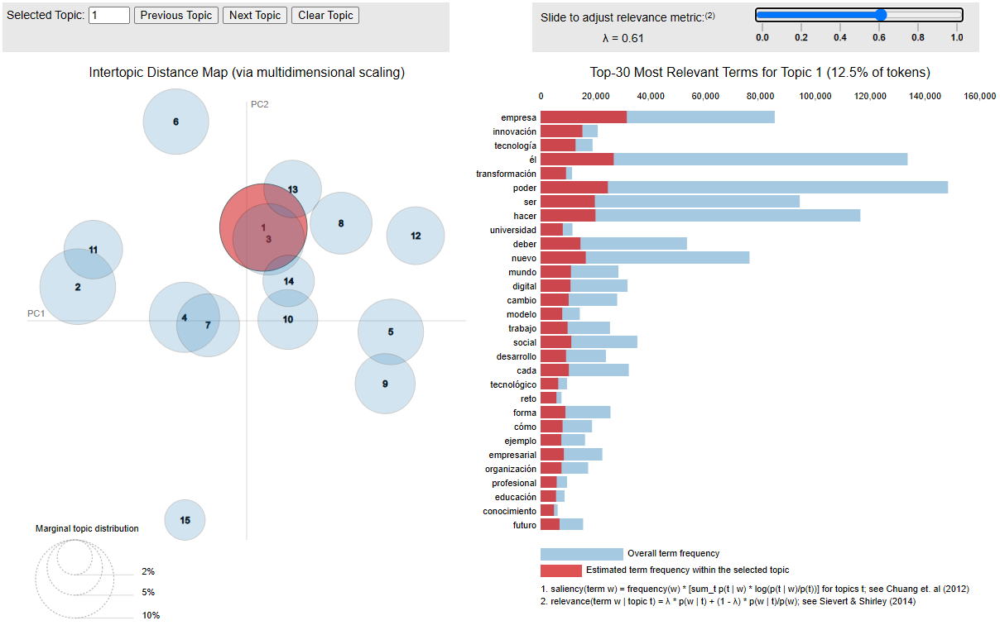

# Categorización automática

In [ ]:
# Cargar el diccionario
dictionary = Dictionary.load("/content/drive/Shareddrives/PLN/Practica02/Modulo_Temas/dictionary.gensim")

# Cargar el modelo LDA
lda_model = LdaModel.load("/content/drive/Shareddrives/PLN/Practica02/Modulo_Temas/lda_model.model")

# Número de palabras clave por tema
num_words = 15

# Cargar modelo de spaCy y stopwords de NLTK
nlp = spacy.load("es_core_news_sm", disable=["ner", "parser"])
nltk.download("stopwords")
stop_words = set(stopwords.words("spanish"))

def preprocess_text(news):
    doc = nlp(news)
    tokens = [token.lemma_ for token in doc if not token.is_punct and token.text.lower() not in stop_words and not token.is_digit]
    return tokens

def get_topics(news):
    tokens = preprocess_text(news)

    if not tokens:
        return None

    # Convierte el texto en bolsa de palabras
    bow = dictionary.doc2bow(tokens)

    # Obtiene la distribución de temas
    topics = lda_model.get_document_topics(bow)

    if not topics:
        return None

    sorted_topics = sorted(topics, key=lambda x: x[1], reverse=True)

    topics_in_words = []
    for topic_id, prob in sorted_topics:
        words = [word for word, _ in lda_model.show_topic(topic_id, num_words)]
        topics_in_words.append((topic_id, prob, words))

    return topics_in_words

In [ ]:
news = "La Economía Global Enfrenta Desafíos: Crecimiento Moderado y Riesgos Latentes. En un contexto de incertidumbre económica global, las principales economías del mundo están experimentando un crecimiento moderado mientras enfrentan desafíos como la inflación persistente, las políticas monetarias restrictivas y la desaceleración del comercio internacional. En este escenario, organismos multilaterales han ajustado sus proyecciones de crecimiento, advirtiendo sobre posibles riesgos a corto y mediano plazo."
get_topics(news)